# 1- Import used Libraries

In [1]:
import numpy as np
import pandas as pd
import os
import hashlib
import glob as gb
import cv2
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from scipy.misc import imread, imresize, imshow
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense,Flatten , Conv2D , MaxPooling2D , Dropout
from tensorflow.keras.models import Model , Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing import image_dataset_from_directory

# 2- Import Data

In [2]:
all_data = "G:\\tensorflow\\Deep Learning Projects\\cars classification\\dataset\\DATA\\"

# 3- Read and Analysis Data

In [3]:
path = 'G:\\tensorflow\\Deep Learning Projects\\cars classification\\dataset\\number_of_samples.csv'

In [4]:
dataset_info = pd.read_csv(path)
dataset_info

,Unnamed: 0,Name of classes,Number of files
0,0,bmw serie 1,82
1,1,chevrolet spark,108
2,2,chevroulet aveo,129
3,3,clio,344
4,4,duster,280
5,5,Golf,160
6,6,hyundai i10,130
7,7,hyundai tucson,128
8,8,logan,112
9,9,megane,280


In [5]:
# Analysis Dataset To Know Count of Data Files in Folders
for folder in  os.listdir(all_data) : 
    files = gb.glob(pathname= str( all_data + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 82 in folder bmw serie 1
For training data , found 108 in folder chevrolet spark
For training data , found 129 in folder chevroulet aveo
For training data , found 344 in folder clio
For training data , found 280 in folder duster
For training data , found 160 in folder Golf
For training data , found 130 in folder hyundai i10
For training data , found 128 in folder hyundai tucson
For training data , found 112 in folder logan
For training data , found 280 in folder megane
For training data , found 84 in folder mercedes class a
For training data , found 80 in folder nemo citroen
For training data , found 156 in folder octavia
For training data , found 178 in folder picanto
For training data , found 132 in folder polo
For training data , found 260 in folder sandero
For training data , found 100 in folder seat ibiza
For training data , found 158 in folder symbol
For training data , found 150 in folder toyota corolla
For training data , found 184 in folder volkswagen

# 4- Clean Data

In [6]:
# Returns a list of folder names in the specified folder
class_names = os.listdir(all_data)
print(class_names)

['bmw serie 1', 'chevrolet spark', 'chevroulet aveo', 'clio', 'duster', 'Golf', 'hyundai i10', 'hyundai tucson', 'logan', 'megane', 'mercedes class a', 'nemo citroen', 'octavia', 'picanto', 'polo', 'sandero', 'seat ibiza', 'symbol', 'toyota corolla', 'volkswagen tiguan']


the number of images in bmw serie 1  is  82
the number of duplicate images in bmw serie 1  is  16
[(1, 0), (24, 21), (26, 25), (31, 30), (33, 32), (34, 8), (35, 12), (36, 23), (42, 41), (46, 44), (57, 45), (71, 69), (73, 72), (78, 77), (80, 79), (81, 43)]


C:\Users\Sally\anaconda3\envs\new_env\lib\site-packages\ipykernel_launcher.py:34: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
C:\Users\Sally\anaconda3\envs\new_env\lib\site-packages\ipykernel_launcher.py:37: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.


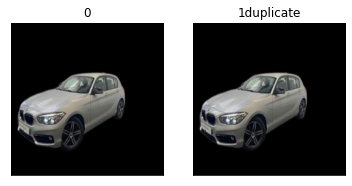

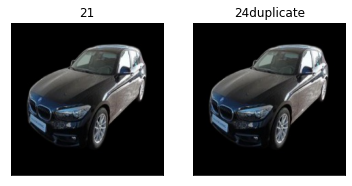

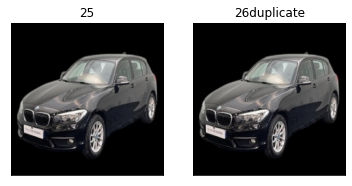

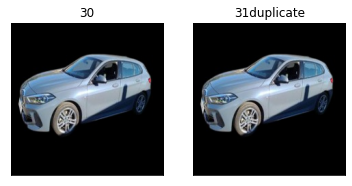

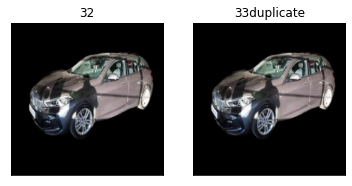

...

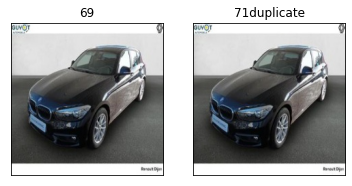

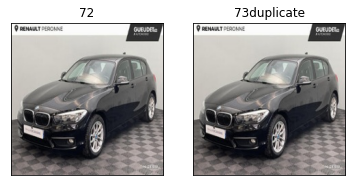

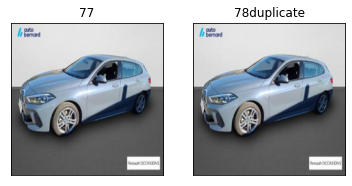

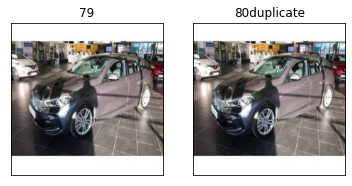

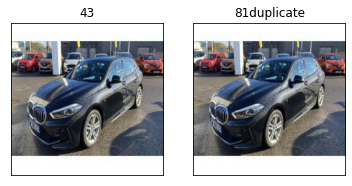

the number of images in chevrolet spark  is  108
the number of duplicate images in chevrolet spark  is  0
[]
the number of images in chevroulet aveo  is  129
the number of duplicate images in chevroulet aveo  is  10
[(32, 31), (49, 47), (56, 55), (58, 55), (59, 55), (101, 100), (118, 116), (125, 124), (127, 124), (128, 124)]


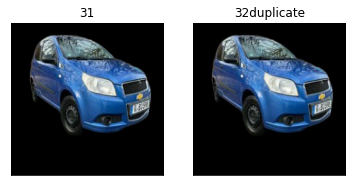

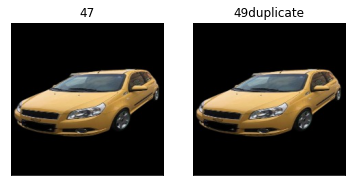

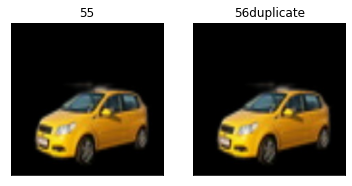

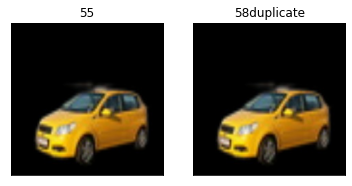

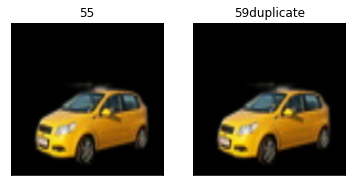

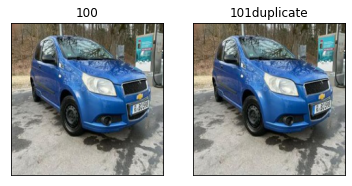

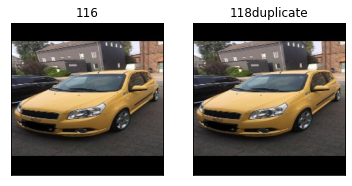

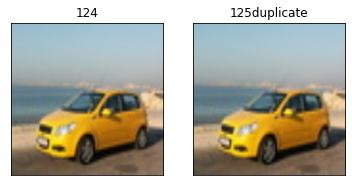

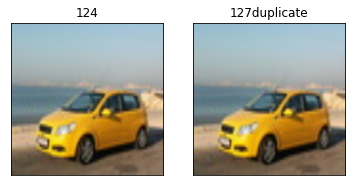

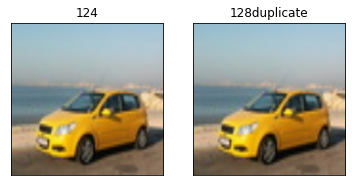

the number of images in clio  is  344
the number of duplicate images in clio  is  58
[(1, 0), (5, 4), (7, 6), (31, 30), (33, 32), (36, 34), (38, 37), (46, 35), (62, 61), (64, 63), (66, 65), (68, 57), (69, 67), (82, 79), (85, 83), (95, 84), (109, 108), (111, 110), (113, 112), (115, 114), (117, 106), (134, 97), (139, 128), (140, 138), (142, 141), (144, 143), (146, 145), (170, 169), (171, 3), (173, 172), (177, 176), (179, 178), (203, 202), (205, 204), (208, 206), (210, 209), (218, 207), (234, 233), (236, 235), (238, 237), (240, 229), (241, 239), (254, 251), (257, 255), (267, 256), (281, 280), (283, 282), (285, 284), (287, 286), (289, 278), (306, 269), (311, 300), (312, 310), (314, 313), (316, 315), (318, 317), (342, 341), (343, 175)]


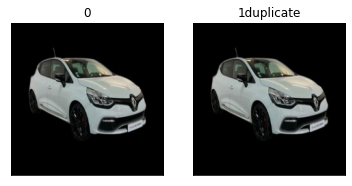

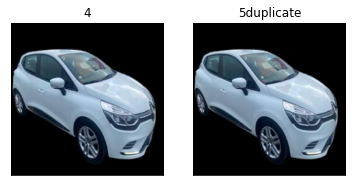

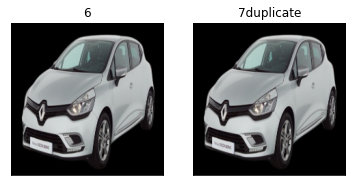

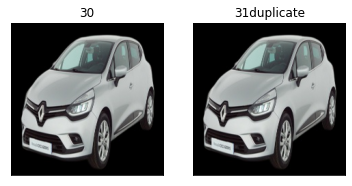

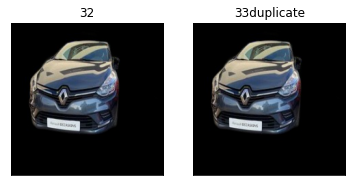

...

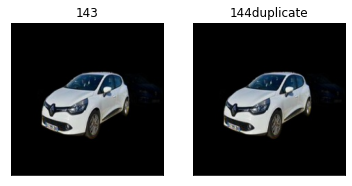

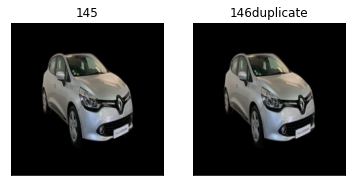

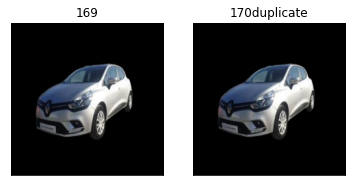

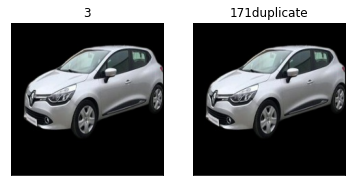

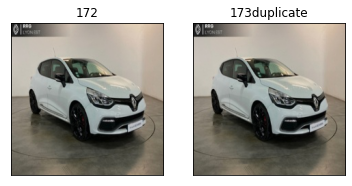

the number of images in duster  is  280
the number of duplicate images in duster  is  40
[(13, 12), (15, 14), (17, 16), (19, 18), (41, 40), (43, 42), (45, 44), (47, 46), (69, 68), (71, 70), (73, 72), (75, 74), (97, 96), (99, 98), (101, 100), (103, 102), (125, 124), (127, 126), (129, 128), (131, 130), (153, 152), (155, 154), (157, 156), (159, 158), (181, 180), (183, 182), (185, 184), (187, 186), (209, 208), (211, 210), (213, 212), (215, 214), (237, 236), (239, 238), (241, 240), (243, 242), (265, 264), (267, 266), (269, 268), (271, 270)]


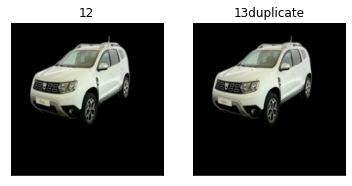

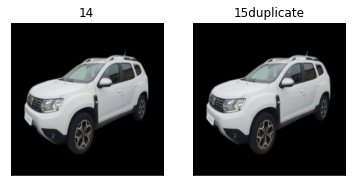

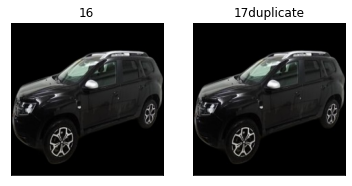

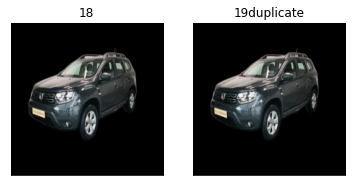

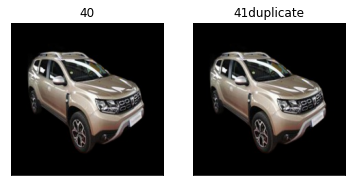

...

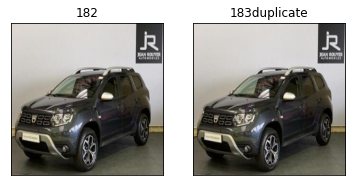

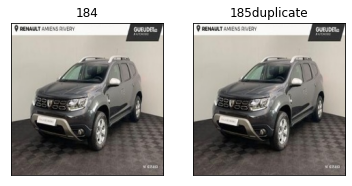

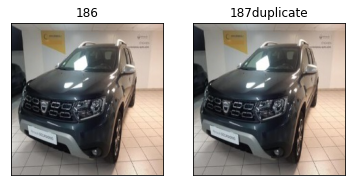

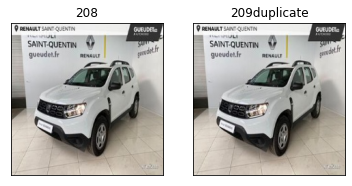

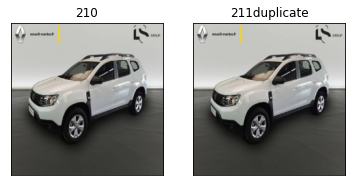

the number of images in Golf  is  160
the number of duplicate images in Golf  is  26
[(1, 0), (22, 21), (23, 12), (25, 24), (27, 26), (29, 28), (34, 12), (45, 12), (53, 52), (55, 54), (58, 57), (60, 59), (67, 56), (81, 80), (102, 101), (103, 92), (105, 104), (107, 106), (109, 108), (114, 92), (125, 92), (133, 132), (135, 134), (138, 137), (140, 139), (147, 136)]


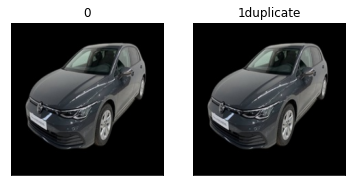

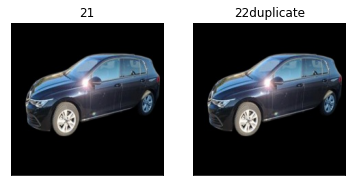

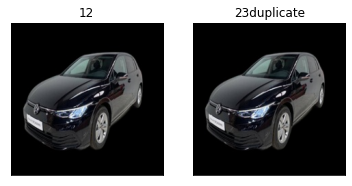

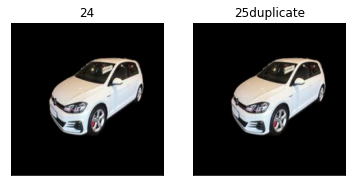

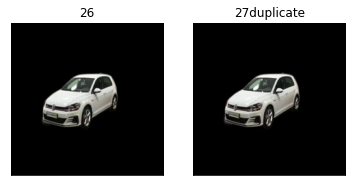

...

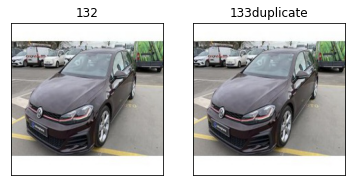

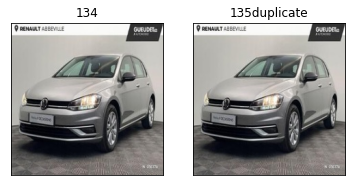

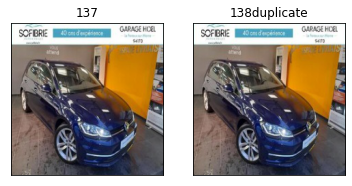

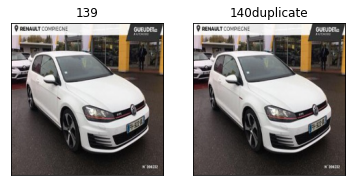

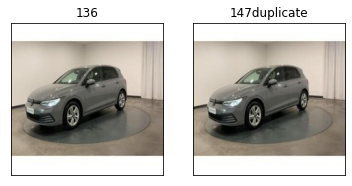

the number of images in hyundai i10  is  130
the number of duplicate images in hyundai i10  is  12
[(1, 0), (8, 7), (10, 9), (12, 11), (32, 28), (51, 49), (66, 65), (73, 72), (75, 74), (77, 76), (97, 93), (116, 114)]


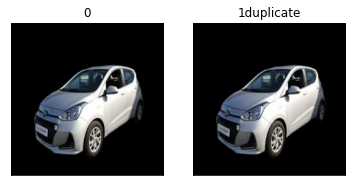

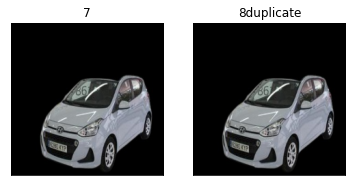

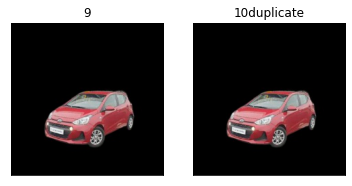

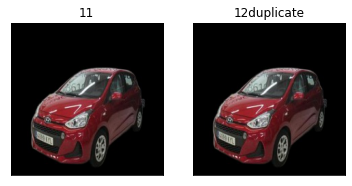

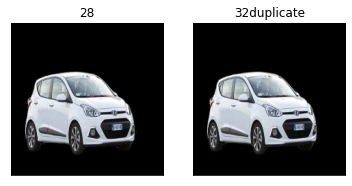

...

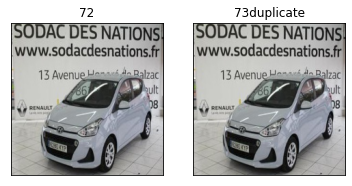

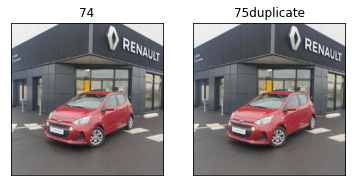

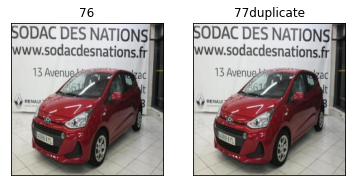

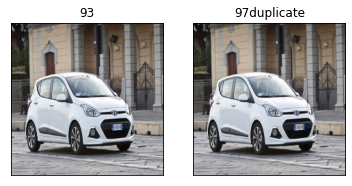

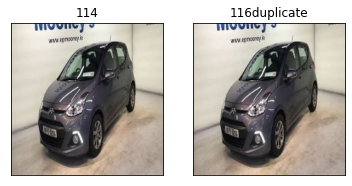

the number of images in hyundai tucson  is  128
the number of duplicate images in hyundai tucson  is  8
[(1, 0), (8, 7), (10, 9), (12, 11), (65, 64), (72, 71), (74, 73), (76, 75)]


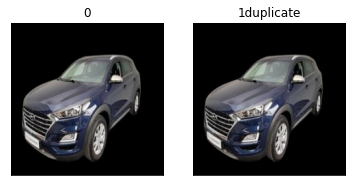

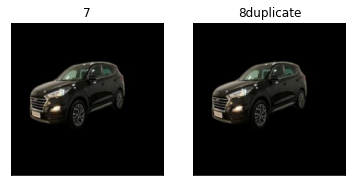

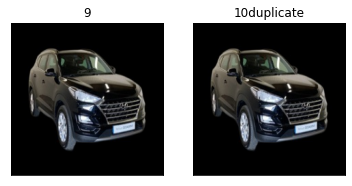

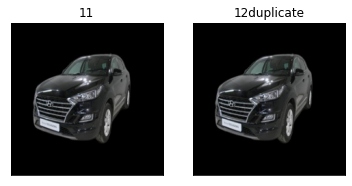

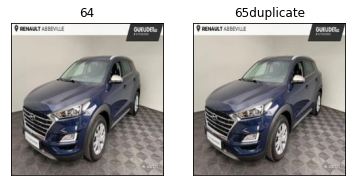

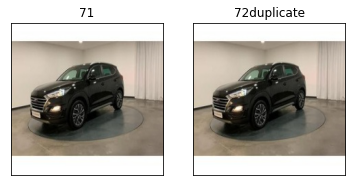

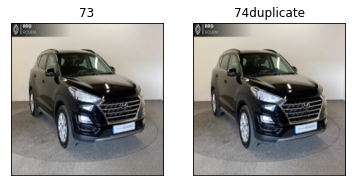

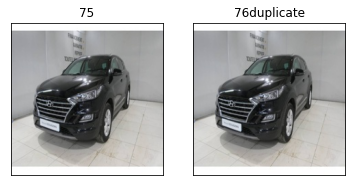

the number of images in logan  is  112
the number of duplicate images in logan  is  64
[(1, 0), (21, 0), (22, 0), (23, 12), (24, 12), (25, 12), (27, 26), (29, 28), (32, 2), (33, 3), (34, 26), (35, 4), (36, 5), (37, 6), (38, 7), (39, 8), (40, 9), (41, 10), (42, 11), (43, 13), (44, 14), (45, 26), (46, 15), (47, 16), (48, 17), (49, 18), (50, 19), (51, 20), (52, 28), (53, 28), (54, 30), (55, 31), (57, 56), (77, 56), (78, 56), (79, 68), (80, 68), (81, 68), (83, 82), (85, 84), (88, 58), (89, 59), (90, 82), (91, 60), (92, 61), (93, 62), (94, 63), (95, 64), (96, 65), (97, 66), (98, 67), (99, 69), (100, 70), (101, 82), (102, 71), (103, 72), (104, 73), (105, 74), (106, 75), (107, 76), (108, 84), (109, 84), (110, 86), (111, 87)]


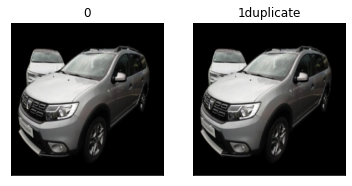

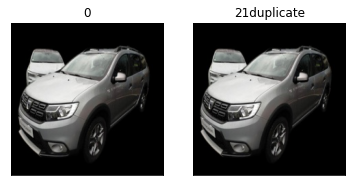

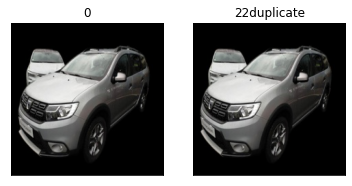

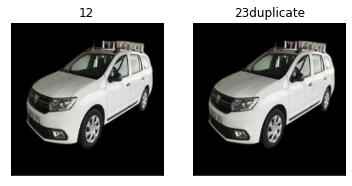

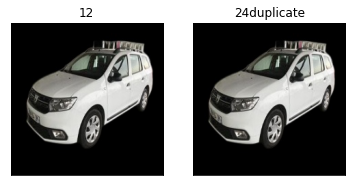

...

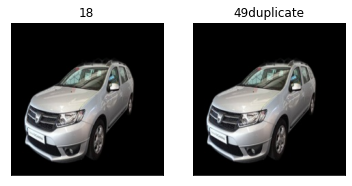

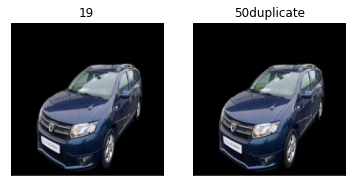

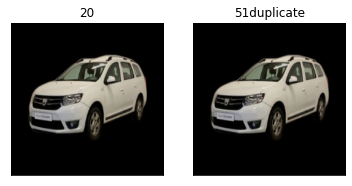

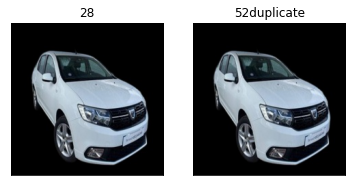

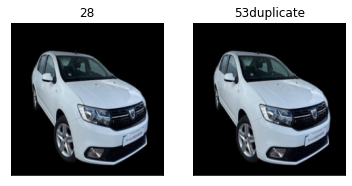

the number of images in megane  is  280
the number of duplicate images in megane  is  40
[(1, 0), (17, 16), (19, 18), (21, 20), (23, 22), (62, 61), (63, 52), (65, 64), (67, 66), (69, 68), (85, 74), (93, 92), (95, 94), (98, 97), (100, 99), (107, 96), (124, 123), (126, 125), (128, 127), (131, 130), (141, 140), (157, 156), (159, 158), (161, 160), (163, 162), (202, 201), (203, 192), (205, 204), (207, 206), (209, 208), (225, 214), (233, 232), (235, 234), (238, 237), (240, 239), (247, 236), (264, 263), (266, 265), (268, 267), (271, 270)]


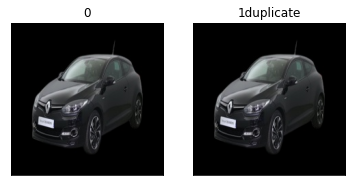

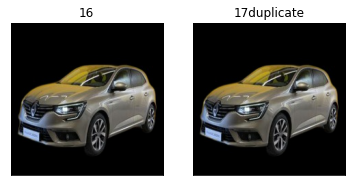

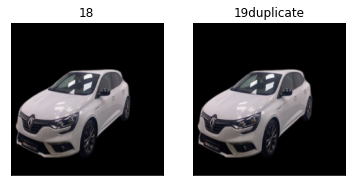

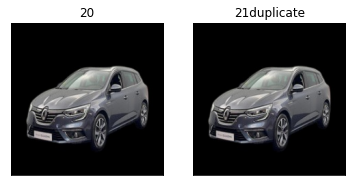

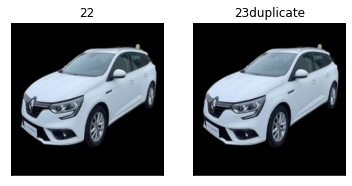

...

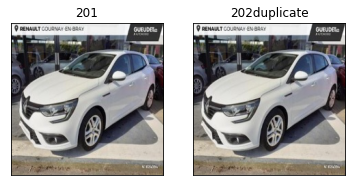

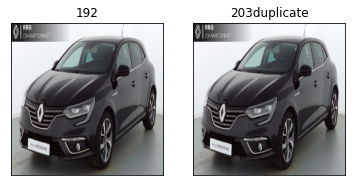

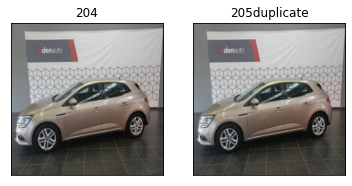

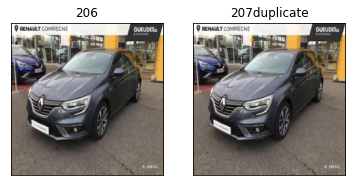

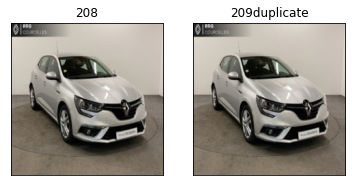

the number of images in mercedes class a  is  84
the number of duplicate images in mercedes class a  is  16
[(1, 0), (22, 21), (23, 12), (25, 24), (27, 26), (29, 28), (37, 34), (39, 38), (43, 42), (64, 63), (65, 54), (67, 66), (69, 68), (71, 70), (79, 76), (81, 80)]


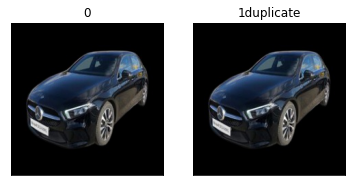

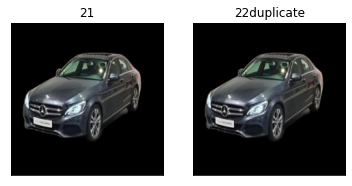

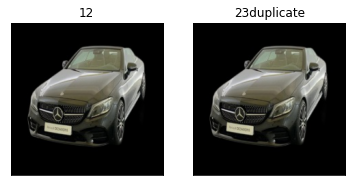

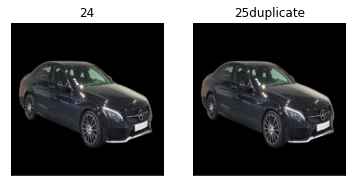

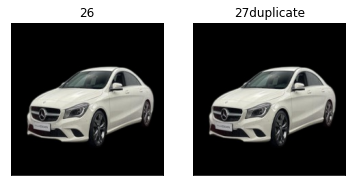

...

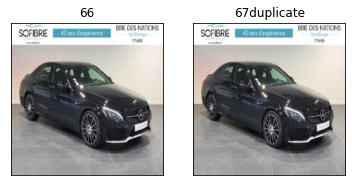

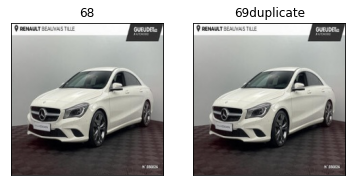

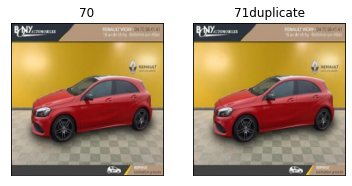

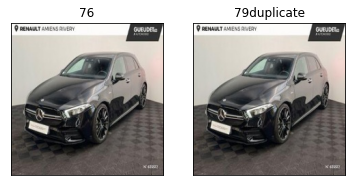

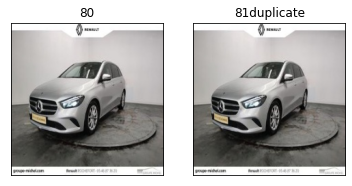

the number of images in nemo citroen  is  80
the number of duplicate images in nemo citroen  is  8
[(1, 0), (3, 2), (5, 4), (7, 6), (41, 40), (43, 42), (45, 44), (47, 46)]


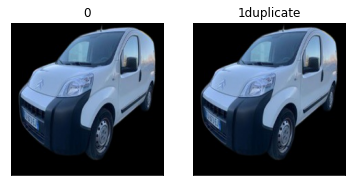

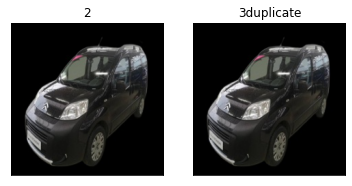

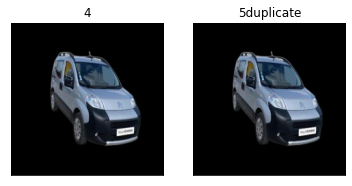

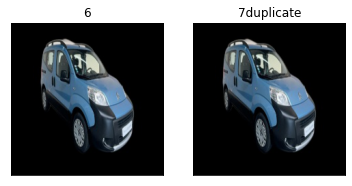

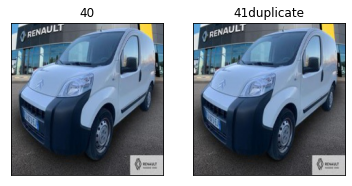

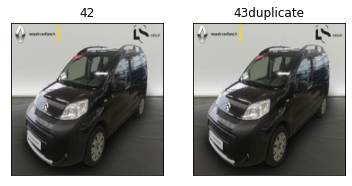

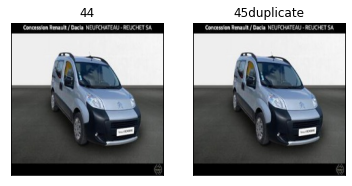

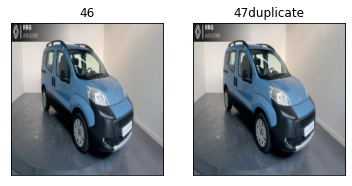

the number of images in octavia  is  156
the number of duplicate images in octavia  is  8
[(1, 0), (3, 2), (75, 74), (77, 76), (116, 115), (118, 117), (120, 119), (122, 121)]


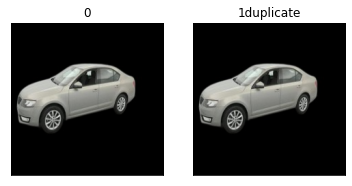

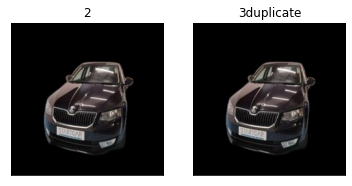

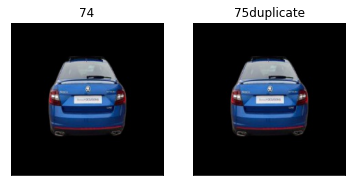

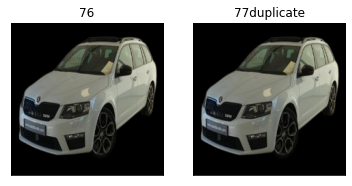

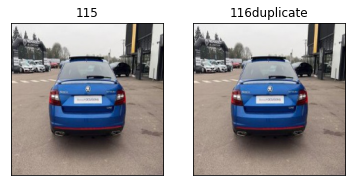

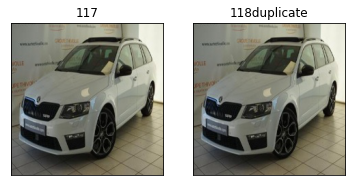

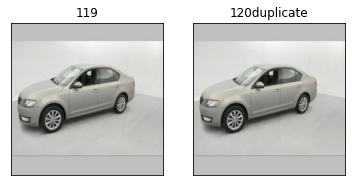

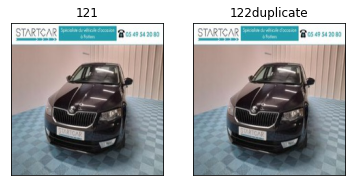

the number of images in picanto  is  178
the number of duplicate images in picanto  is  44
[(4, 3), (11, 9), (12, 9), (13, 10), (14, 9), (15, 10), (16, 10), (17, 9), (18, 10), (19, 9), (20, 10), (21, 9), (22, 10), (23, 9), (24, 10), (26, 9), (27, 10), (28, 9), (29, 10), (30, 25), (32, 31), (33, 2), (106, 105), (113, 111), (114, 111), (115, 112), (116, 111), (117, 112), (118, 112), (119, 111), (120, 112), (121, 111), (122, 112), (123, 111), (124, 112), (125, 111), (126, 112), (128, 111), (129, 112), (130, 111), (131, 112), (132, 127), (134, 133), (135, 104)]


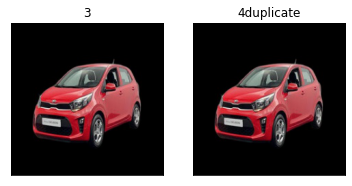

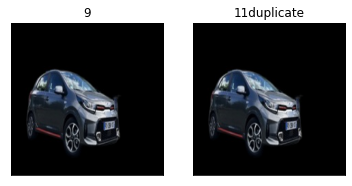

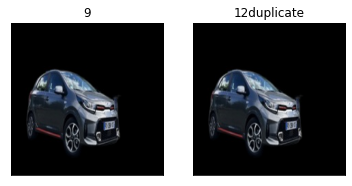

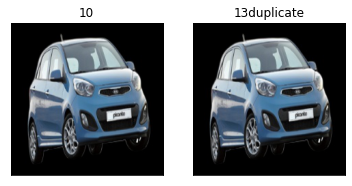

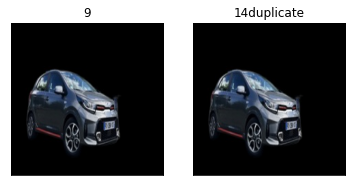

...

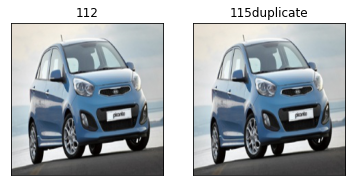

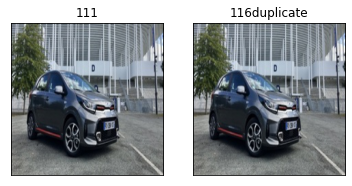

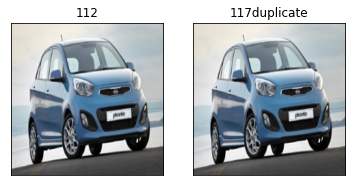

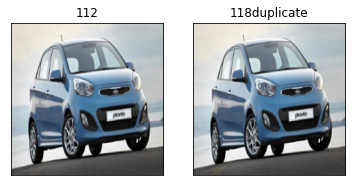

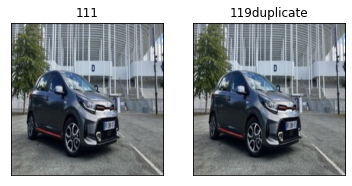

the number of images in polo  is  132
the number of duplicate images in polo  is  16
[(1, 0), (22, 21), (23, 12), (25, 24), (27, 26), (29, 28), (39, 34), (41, 40), (67, 66), (88, 87), (89, 78), (91, 90), (93, 92), (95, 94), (105, 100), (107, 106)]


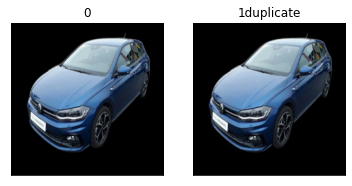

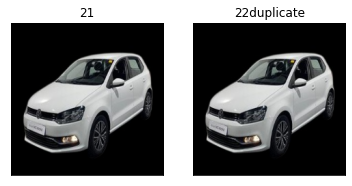

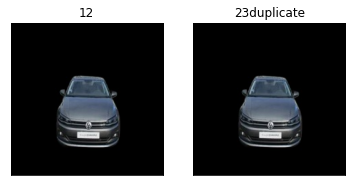

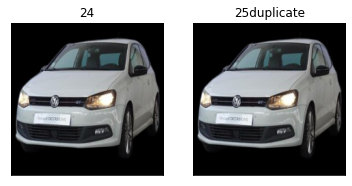

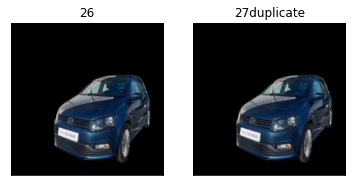

...

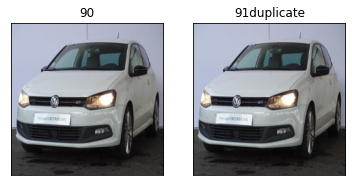

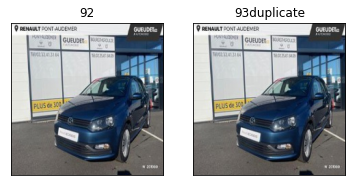

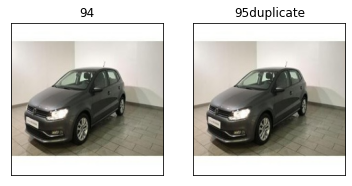

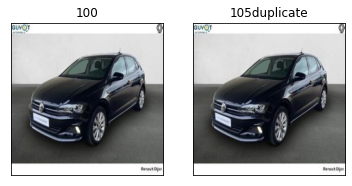

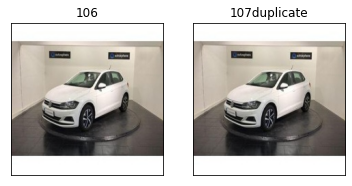

the number of images in sandero  is  260
the number of duplicate images in sandero  is  32
[(7, 6), (40, 39), (41, 30), (43, 42), (45, 44), (47, 46), (63, 52), (71, 70), (73, 72), (76, 75), (78, 77), (85, 74), (102, 101), (104, 103), (106, 105), (109, 108), (137, 136), (170, 169), (171, 160), (173, 172), (175, 174), (177, 176), (193, 182), (201, 200), (203, 202), (206, 205), (208, 207), (215, 204), (232, 231), (234, 233), (236, 235), (239, 238)]


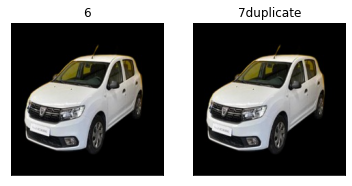

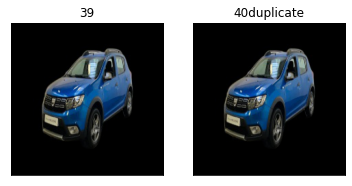

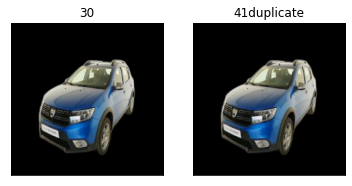

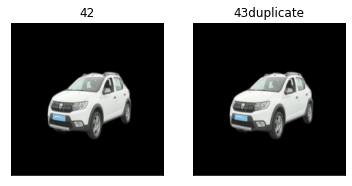

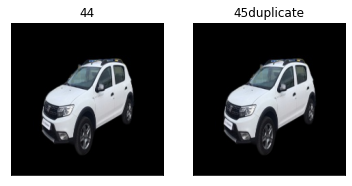

...

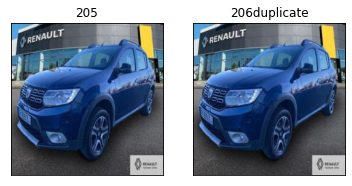

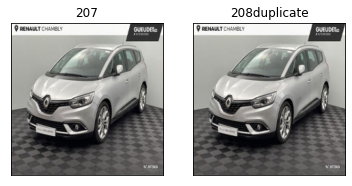

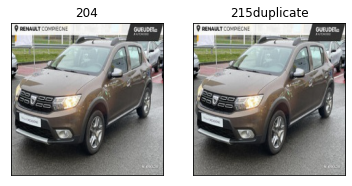

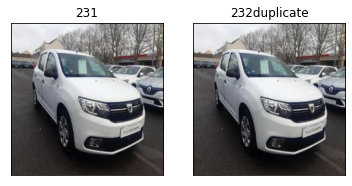

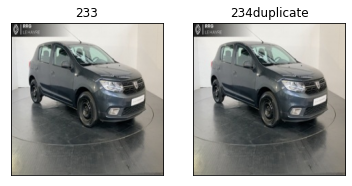

the number of images in seat ibiza  is  100
the number of duplicate images in seat ibiza  is  16
[(1, 0), (9, 8), (11, 10), (14, 13), (16, 15), (23, 12), (28, 27), (30, 29), (51, 50), (59, 58), (61, 60), (64, 63), (66, 65), (73, 62), (78, 77), (80, 79)]


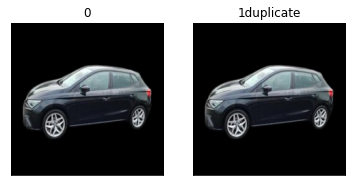

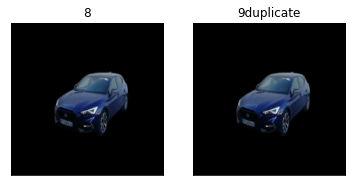

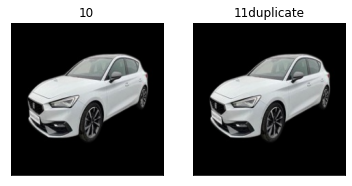

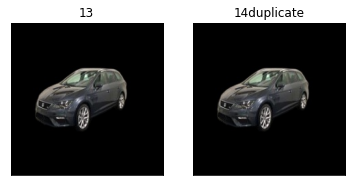

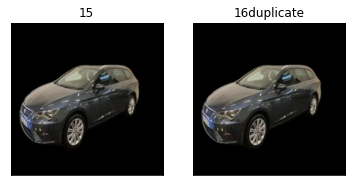

...

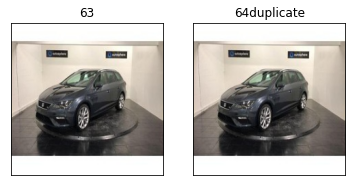

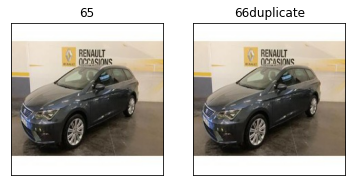

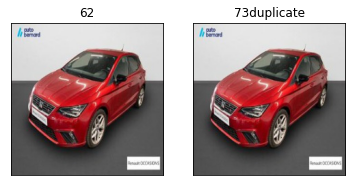

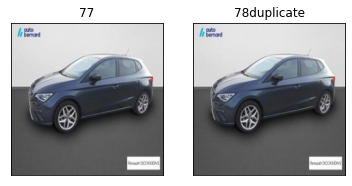

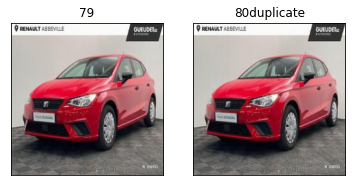

the number of images in symbol  is  158
the number of duplicate images in symbol  is  8
[(24, 0), (27, 3), (55, 2), (84, 81), (96, 83), (116, 92), (119, 95), (147, 94)]


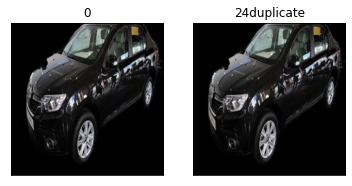

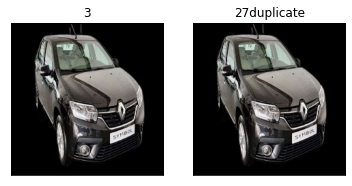

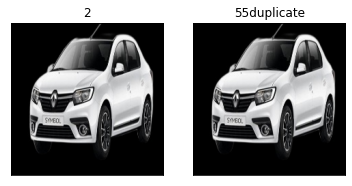

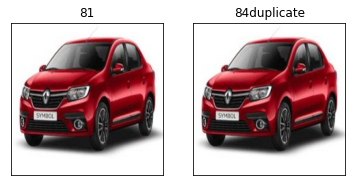

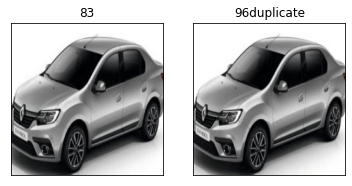

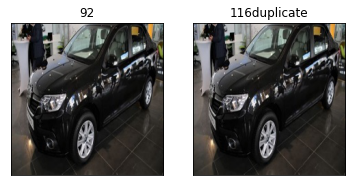

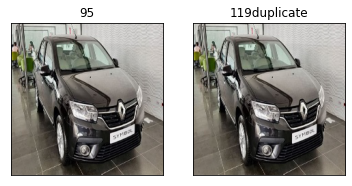

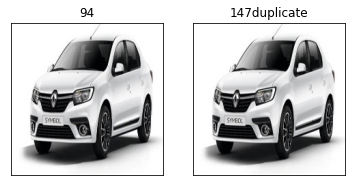

the number of images in toyota corolla  is  150
the number of duplicate images in toyota corolla  is  0
[]
the number of images in volkswagen tiguan  is  184
the number of duplicate images in volkswagen tiguan  is  16
[(1, 0), (22, 21), (23, 12), (25, 24), (27, 26), (29, 28), (36, 34), (38, 37), (93, 92), (114, 113), (115, 104), (117, 116), (119, 118), (121, 120), (128, 126), (130, 129)]


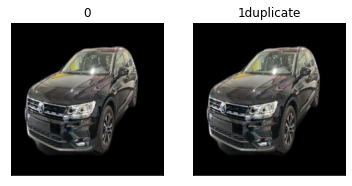

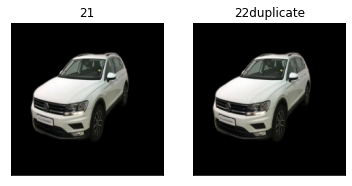

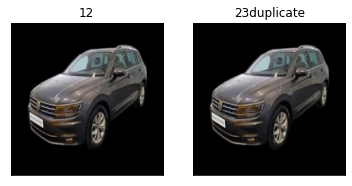

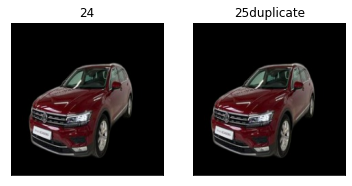

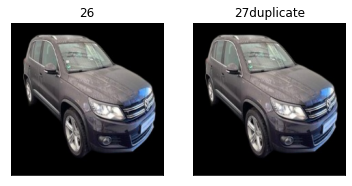

...

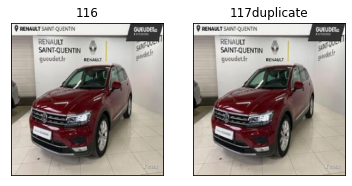

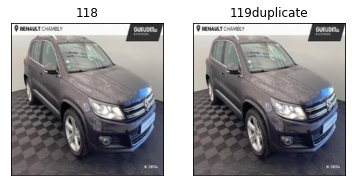

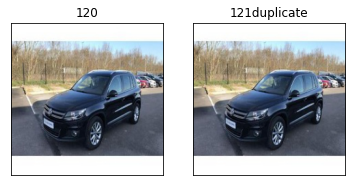

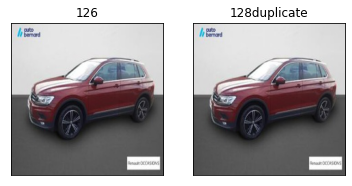

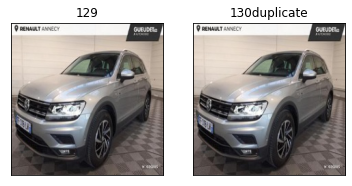

In [7]:
# Function To Remove Duplicate Images
def file_hash(filename):
    with open(filename,'rb') as f:
        return md5(f.read()).hexdigest()
    
for x in class_names:
    os.getcwd()
    os.chdir(r"G:\\tensorflow\\Deep Learning Projects\\cars classification\\dataset\\DATA\\" + str(x))
    os.getcwd()

    files_list = os.listdir('.')
    print("the number of images in", str(x) , " is ", len(files_list))

    duplicates=[]
    hash_keys=dict()
    for index, filename in enumerate(os.listdir('.')):
        if os.path.isfile(filename):
            with open(filename, 'rb') as f:
                filehash = hashlib.md5(f.read()).hexdigest()
            if filehash not in hash_keys:
                hash_keys[filehash]=index
            else:
                duplicates.append((index,hash_keys[filehash]))
            
    print("the number of duplicate images in" , str(x) , " is " , len(duplicates))
    print(duplicates)
    for file_indexes in duplicates[:30]:
        try:
            plt.subplot(121),plt.imshow(imread(files_list[file_indexes[1]]))
            plt.title(file_indexes[1]),plt.xticks([]),plt.yticks([])

            plt.subplot(122),plt.imshow(imread(files_list[file_indexes[0]]))
            plt.title(str(file_indexes[0])+ 'duplicate'),plt.xticks([]),plt.yticks([])
            plt.show()

        except OSError as e:
            continue

    for index in duplicates:
        os.remove(files_list[index[0]])

# 5- Visualization   

<AxesSubplot:xlabel='Number of files', ylabel='Name of classes'>

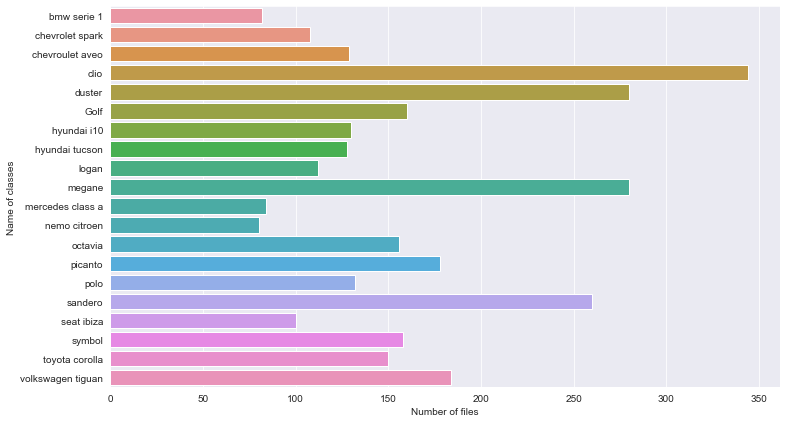

In [8]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,7))
sns.barplot(x=dataset_info['Number of files'],y=dataset_info['Name of classes'])

# 6- PreProcessing Data ( Resize and Labeled Images )

In [9]:
# now we need to check the images sizes , to know ow they looks like
# since we have 20 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

car_types_dict = {'bmw serie 1':0 ,'chevrolet spark':1,'chevroulet aveo':2,'clio':3,'duster':4,'Golf':5,'hyundai i10':6,'hyundai tucson':7,'logan':8,'megane':9,'mercedes class a':10,'nemo citroen':11,'octavia':12,'picanto':13,'polo':14,'sandero':15,'seat ibiza':16,'symbol':17,'toyota corolla':18,'volkswagen tiguan':19}

def getcode(n) : 
    for x , y in car_types_dict.items() : 
        if n == y : 
            return x

In [10]:
# check dimentional images
# now how about the images sizes in dataset folder

size = []
for folder in  os.listdir(all_data) : 
    files = gb.glob(pathname= str( all_data + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(224, 224, 3)    2797
dtype: int64

In [11]:
# Create a variable to hold the size of all images
image_size = 224

In [12]:
# labeled category images for Data

X_train = []
y_train = []
for folder in  os.listdir(all_data) : 
    files = gb.glob(pathname= str( all_data + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (image_size,image_size))
        X_train.append(list(image_array))
        y_train.append(car_types_dict[folder])

In [13]:
print(f'we have {len(X_train)} items in X_train')

we have 2797 items in X_train


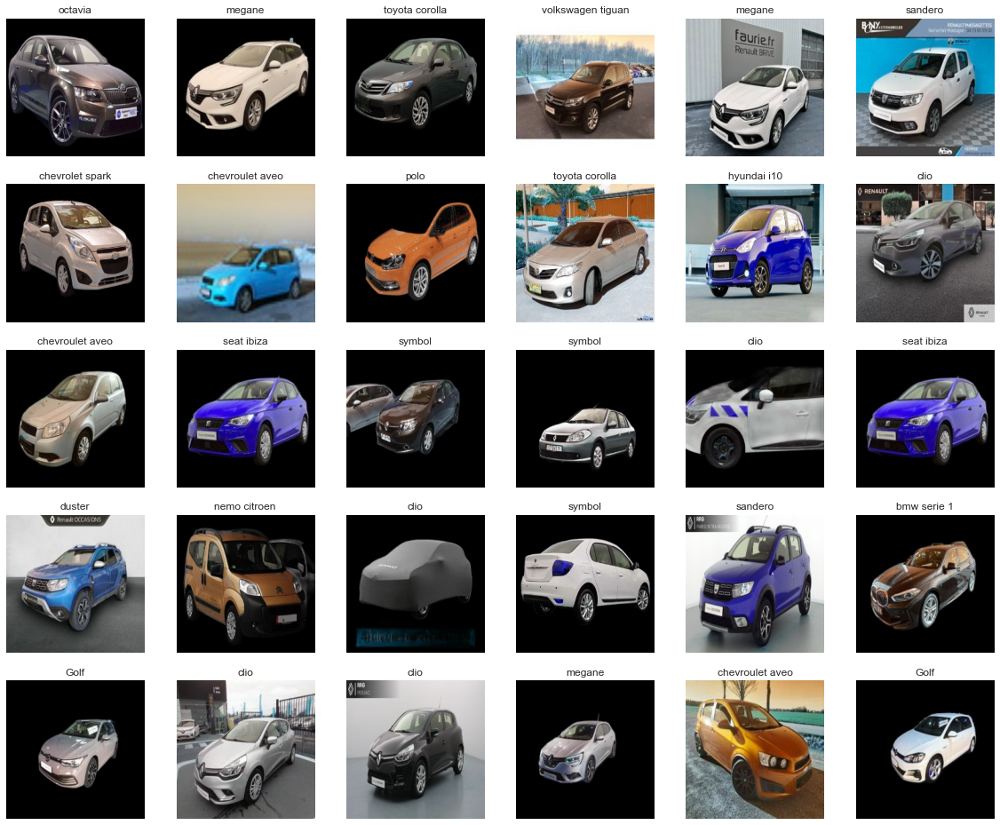

In [14]:
# Show random 30 Images from data and its names

plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),30))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

# 7- Divide Dataset into 80% training Data and 20% testing Data

In [15]:
# Load training and validation datasets

# 80% training Data
train = image_dataset_from_directory(
    all_data,   #directory
    validation_split=0.2,
    subset='training',
    labels='inferred',
    label_mode='categorical',
    image_size=[224, 224],
    seed=123,
    interpolation='nearest',
    batch_size=64,
    shuffle=True,
)

# 20% testing Data
test = image_dataset_from_directory(
    all_data,    #directory
    validation_split=0.2,
    subset='validation',
    labels='inferred',
    label_mode='categorical',
    image_size=[224, 224],
    seed=123,
    interpolation='nearest',
    batch_size=64,
    shuffle=False,
)

Found 2797 files belonging to 20 classes.
Using 2238 files for training.
Found 2797 files belonging to 20 classes.
Using 559 files for validation.


# 8- Building Convolutional  Neural Network

In [16]:
# now building the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

# Initialising the CNN
KerasModel = keras.models.Sequential([
    
#1 - Convolution
        Rescaling(1./255 ,input_shape=(224,224,3)),

        keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
        keras.layers.MaxPool2D(),
    
#2 - Pooling
# Hidden Layer 1
        keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
        keras.layers.MaxPool2D(),

# Adding a second convolution layer
# where relu turns negative values in images to 0
        keras.layers.Conv2D(64, 3, padding='same', activation='relu'),        
        keras.layers.MaxPool2D(),

# include dropout with probability of 0.2 to avoid overfitting
        keras.layers.Dropout(0.2) , 
    
#3 - Flattening
# converts the matrix in a single array
        keras.layers.Flatten() , 
    
#4 - Full Connection    
        keras.layers.Dense(128,activation='relu') ,    

#5 Last layer, using softmax to 20 classes
        keras.layers.Dense(20,activation='softmax') , 
        ])

In [17]:
# now using adam optimizer , & sparse categorical crossentropy loss to compile the model

KerasModel.compile(loss='categorical_crossentropy',optimizer='adam' , metrics=['accuracy'])

In [18]:
# Set callback functions to early stop training 

mycallbacks = [EarlyStopping(monitor='val_loss', patience=5,  restore_best_weights=True)]
ThisModel = KerasModel.fit(train,validation_data=test, epochs=20, callbacks=mycallbacks )

Epoch 1/20
35/35 [==============================] - 61s 2s/step - loss: 2.9272 - accuracy: 0.0979 - val_loss: 2.8240 - val_accuracy: 0.0304
Epoch 2/20
35/35 [==============================] - 58s 2s/step - loss: 2.5547 - accuracy: 0.2270 - val_loss: 2.3031 - val_accuracy: 0.3327
Epoch 3/20
35/35 [==============================] - 60s 2s/step - loss: 1.8163 - accuracy: 0.4638 - val_loss: 1.5018 - val_accuracy: 0.5760
Epoch 4/20
35/35 [==============================] - 65s 2s/step - loss: 0.9011 - accuracy: 0.7332 - val_loss: 0.5842 - val_accuracy: 0.8426
Epoch 5/20
35/35 [==============================] - 69s 2s/step - loss: 0.3357 - accuracy: 0.9075 - val_loss: 0.4475 - val_accuracy: 0.8998
Epoch 6/20
35/35 [==============================] - 71s 2s/step - loss: 0.1533 - accuracy: 0.9665 - val_loss: 0.5710 - val_accuracy: 0.8927
Epoch 7/20
35/35 [==============================] - 62s 2s/step - loss: 0.0643 - accuracy: 0.9826 - val_loss: 0.6265 - val_accuracy: 0.8819
Epoch 8/20
35/35 [==

In [19]:
# Evaluation Model
KerasModel.evaluate(test)

9/9 [==============================] - 3s 378ms/step - loss: 0.3590 - accuracy: 0.9445


[0.35902562737464905, 0.9445438385009766]

In [20]:
pred_dataset = "G:\\tensorflow\\Deep Learning Projects\\cars classification\\dataset\\"

In [21]:
X_pred = []
files = gb.glob(pathname= str( pred_dataset + 'predict/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (224,224))
    X_pred.append(list(image_array)) 

In [22]:
print(f'we have {len(X_pred)} items in X_pred')

we have 60 items in X_pred


In [23]:
X_pred_array = np.array(X_pred)
print(f'X_pred shape  is {X_pred_array.shape}')

X_pred shape  is (60, 224, 224, 3)


In [25]:
# now to predict X test
y_pred = KerasModel.predict(test)

print('Prediction Shape is {}'.format(y_pred.shape))

Prediction Shape is (559, 20)


In [26]:
# now it's time to redict X Predict

y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

Prediction Shape is (60, 20)


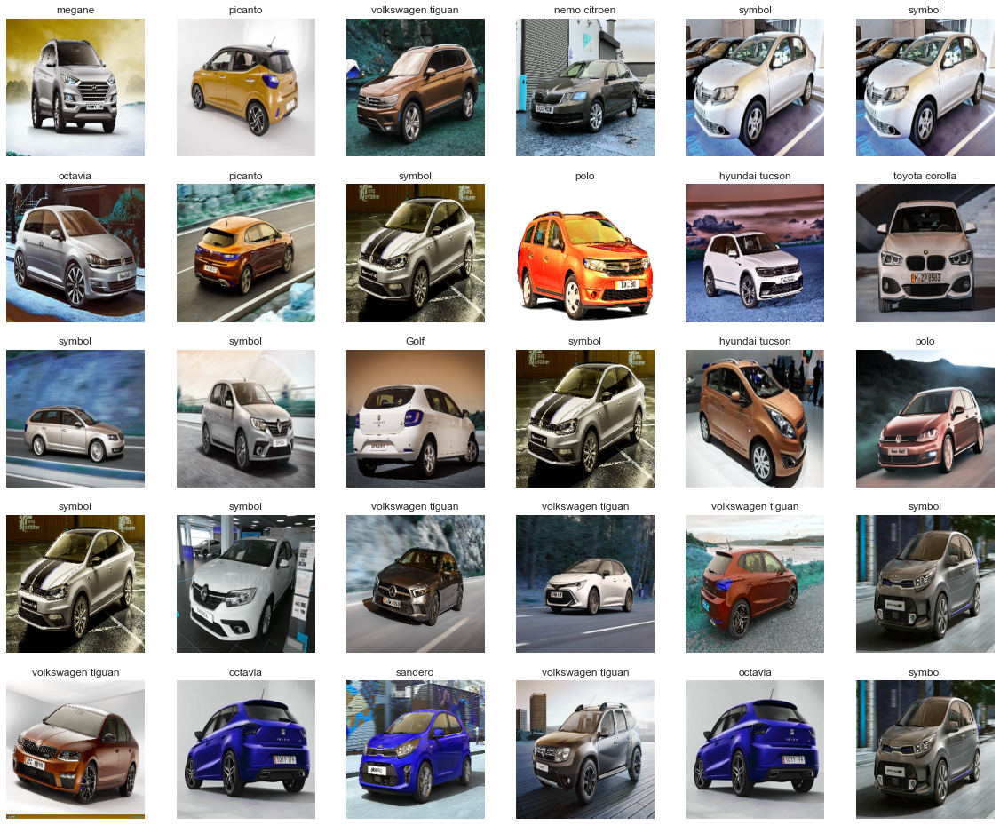

In [27]:
# show random redicted pictures & its predicting category

plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),30))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))
